# **[HuBMAP 2023] whole and kfold coco dataset generator**

## Dataset 
Whole Slide Images (WSI) split into two datasets. Tiles from Dataset 1 have annotations that have been expert reviewed. Dataset 2 comprises the remaining tiles from these same WSIs and contain sparse annotations that have not been expert reviewed.

- All of the test set tiles are from Dataset 1.
- Two of the WSIs make up the training set, two WSIs make up the public test set, and one WSI makes up the private test set.
- The training data includes Dataset 2 tiles from the public test WSI, but not from the private test WSI.

- We also include, as Dataset 3, tiles extracted from an additional nine WSIs. These tiles have not been annotated. You may wish to apply semi- or self-supervised learning techniques on this data to support your predictions.

- conclusion : 1. 데이터셋 3은 어노테이션이 없기에 semi label로 사용하거나 버리거나,
               2. test set은 온전히 dataset 1로 구성, dataset 1은 전문가들이 검수한 어노테이션, dataset은 전문가들이 검수하지 않은 어노테이션, train set은 dataset 2도 포함(public test) 
               3. public test set은 dataset 2도 포함, private set은 dataset 1
               
               :: dataset 1,2을 잘 섞어서 public set과 private set 성능을 높이자.

### Versions
- version_1 : whole_sliding_image -> select blood_vessel,glomerulus
- version_2 : whole_image -> select blood_vessel, and no stride
- version_3 : 1,3,4 source_wsi train set, 2 source_wsi valid set
- version_4 : 2,3,4 source_wsi train set, 1 source_wsi valid set
- version_16 : dataset 1
### dataset
- train set - stride
- valid set - no stride

In [1]:
!pip install pycocotools -Uqq

### importing libraries

In [2]:
import os
import json, cv2, numpy as np, itertools, random, pandas as pd
from pycocotools.coco import COCO
from pycocotools import mask as maskUtils
from skimage import io
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm.auto import tqdm
from sklearn import model_selection
from glob import glob
from PIL import Image
from itertools import chain

import scipy.misc
import imageio
import matplotlib.pyplot as plt
from skimage import io
from pycocotools.coco import COCO
import matplotlib.patches as mpatches

from sklearn.model_selection import StratifiedKFold
import uuid


In [3]:
def make_mask_df(path):
    with open(path+'polygons.jsonl', 'r') as json_file:
        json_list = list(json_file)

    tiles_dicts = []
    for json_str in json_list:
        tiles_dicts.append(json.loads(json_str))

    mask_train = pd.DataFrame()

    mask_train['id'] = list(chain(*[[data['id']] * len(data['annotations']) for data in tiles_dicts]))
    mask_train['type'] = [ inner['type'] for data in tiles_dicts for inner in data['annotations']]
    mask_train['annotations'] = [inner["coordinates"] for data in tiles_dicts for inner in data['annotations']]

    return mask_train

In [4]:
p = '/kaggle/input/hubmap-hacking-the-human-vasculature/'
train = pd.read_csv(p+'tile_meta.csv')
train = train[train['dataset']==1].reset_index(drop=True)
train['path'] = train['id'].map(lambda x: p + 'train/' + str(x) + '.tif')
wsi = pd.read_csv(p+'wsi_meta.csv')
# mask_df = pd.read_json(p+'polygons.jsonl', lines=True)
mask_df = make_mask_df(p)
mask_df = mask_df[mask_df['type']=='blood_vessel'].reset_index(drop=True)

test = pd.DataFrame(glob(p+'test/**.tif'), columns=['path'])
test['id'] = test['path'].map(lambda x: x.split('/')[-1].split('.')[0])

sub = pd.read_csv(p+'sample_submission.csv')

In [5]:
train.source_wsi.unique()

array([1, 2])

In [6]:
# print(wsi[wsi.source_wsi == 2])
# paths = train[train['source_wsi']==2].reset_index(drop=True)


full_imgs = []
full_masks = []
for wsi_num in tqdm([1,2]):
    paths = train[train['source_wsi']==wsi_num].reset_index(drop=True)
    x, y = (paths.i.max() + 512, paths.j.max() + 512)
    x_, y_ = paths.i.min(), paths.j.min()
    full_img = Image.new(mode="RGB", size=(x - x_, y - y_)) # TIFF
    full_mask = Image.new(mode='L', size=(x - x_, y - y_)) # gray
    for i in range(len(paths)):
        id_ = paths.iloc[i]['id']
        full_img.paste(Image.open(paths.path[i]), (paths.i[i] - x_, paths.j[i] - y_))
        mask = np.zeros((512, 512), dtype=np.float32)
        temp_mask_df = mask_df[mask_df['id']==id_].reset_index(drop=True)
        for cords in temp_mask_df['annotations']:
            for cord in cords:
                rr, cc = np.array([i[1] for i in cord]), np.asarray([i[0] for i in cord])
                mask[rr, cc] = 1
        contours,_ = cv2.findContours((mask*255).astype(np.uint8), 1, 2)
        zero_img = np.zeros([mask.shape[0], mask.shape[1]], dtype="uint8")

        for p in contours:
            cv2.fillPoly(zero_img, [p], 1)

        full_mask.paste(Image.fromarray(zero_img), (paths.i[i] - x_, paths.j[i] - y_))
        
    full_imgs.append(np.array(full_img))
    full_masks.append(np.array(full_mask))

# full_img = full_img.resize((x // 2, y // 2))
# full_mask = full_mask.resize((x//2, y//2))


  0%|          | 0/2 [00:00<?, ?it/s]

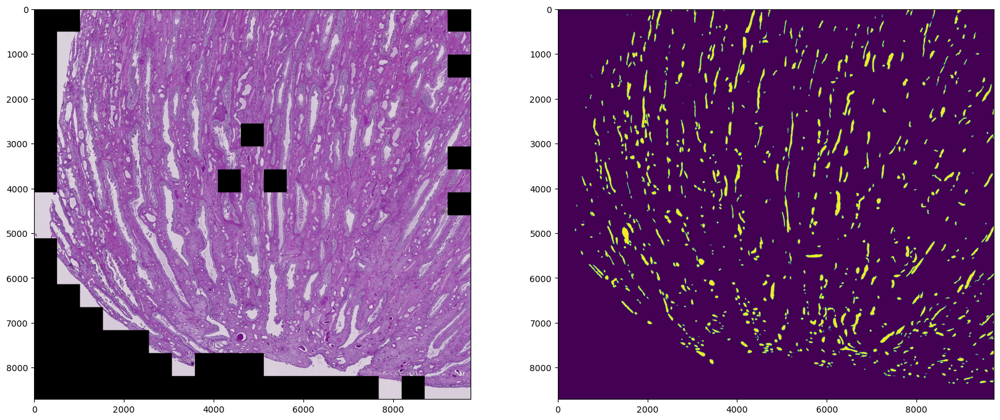

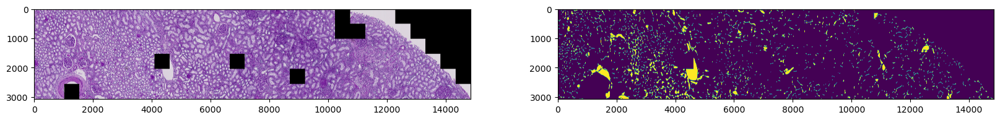

In [7]:
for i in [0,1]:
    plt.figure(figsize=(20,16))
    plt.subplot(1,2,1)
    plt.imshow(full_imgs[i])
    plt.subplot(1,2,2)
    plt.imshow(full_masks[i])
    plt.show()

In [8]:
ww_1 = 7168
a_1_img = full_imgs[0][:,:ww_1,:]
a_1_mask = full_masks[0][:,:ww_1]
b_1_img = full_imgs[0][:,ww_1:,:]
b_1_mask = full_masks[0][:,ww_1:]


ww_2 = 8192
a_2_img = full_imgs[1][:,:ww_2,:]
a_2_mask = full_masks[1][:,:ww_2]
b_2_img = full_imgs[1][:,ww_2:,:]
b_2_mask = full_masks[1][:,ww_2:]

full_imgs[0] = a_1_img
full_imgs[1] = a_2_img
full_masks[0] = a_1_mask
full_masks[1] = a_2_mask
full_imgs.append(b_1_img)
full_imgs.append(b_2_img)
full_masks.append(b_1_mask)
full_masks.append(b_2_mask)


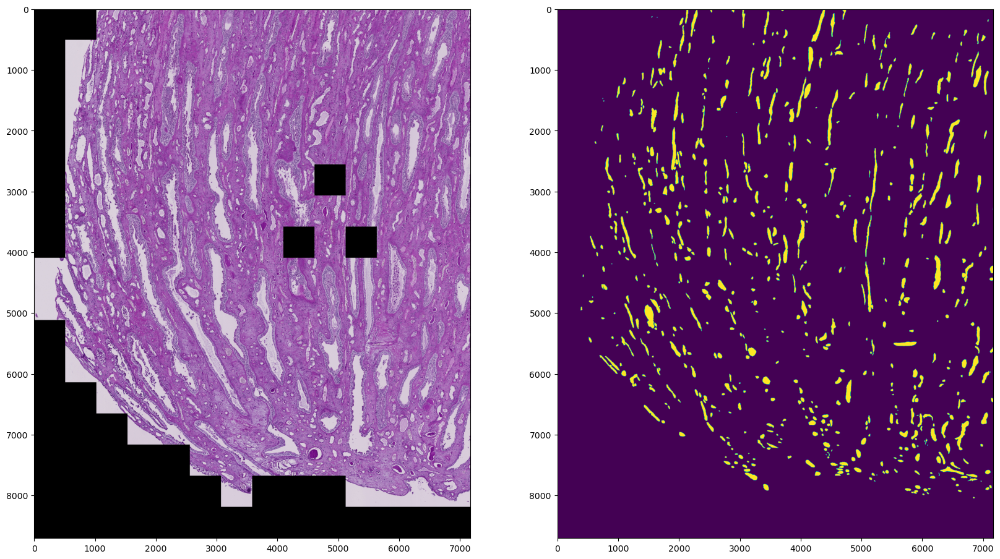

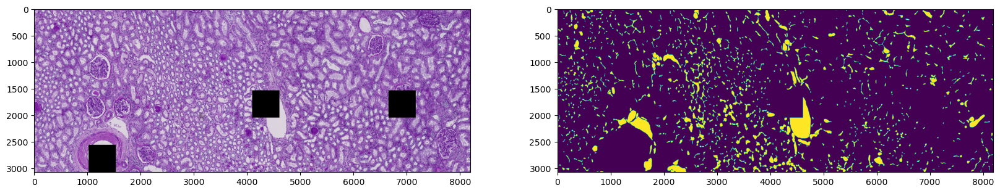

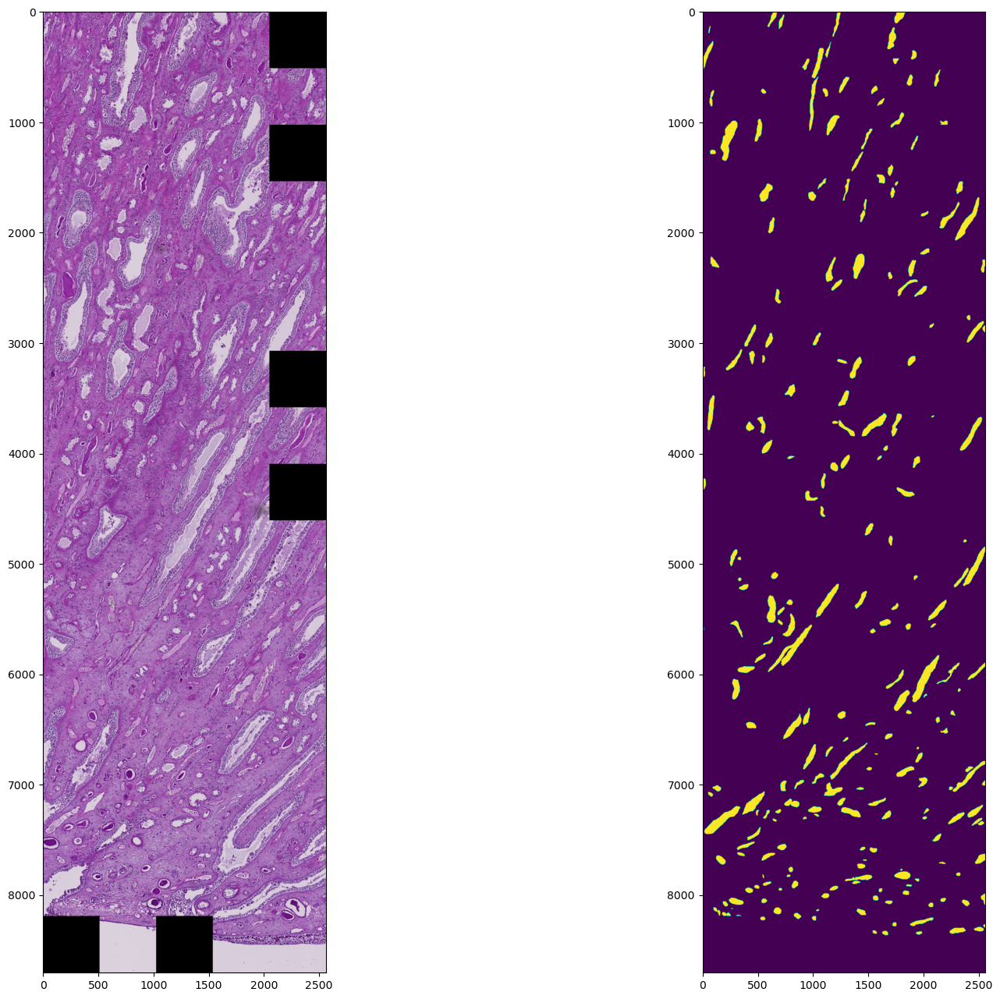

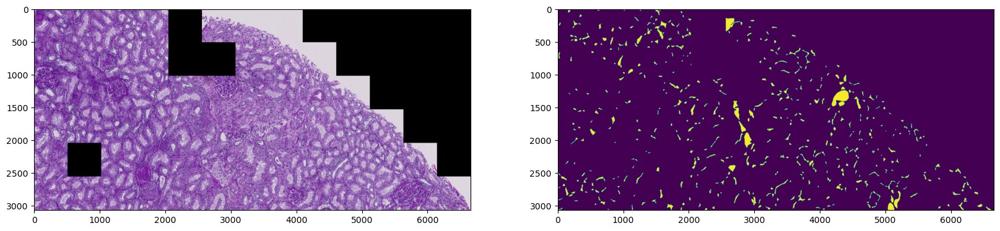

In [9]:
for i in [0,1,2,3]:
    plt.figure(figsize=(20,16))
    plt.subplot(1,2,1)
    plt.imshow(full_imgs[i])
    plt.subplot(1,2,2)
    plt.imshow(full_masks[i])
    plt.show()

In [10]:
len(full_imgs)

4

In [11]:
# np.array(full_imgs[0]).shape, np.array(full_masks[0]).shape

In [12]:
# kernel = np.ones(shape=(3, 3), dtype=np.uint8)
# test_mask = cv2.dilate(np.array(full_masks[0]), kernel, 4)
# test_mask = test_mask.astype(np.uint8)

In [13]:
# for i in [0,1,2,3]:
#     plt.figure(figsize=(20,16))
#     plt.subplot(1,2,1)
#     plt.imshow(np.array(full_imgs[i]))
#     plt.subplot(1,2,2)
#     plt.imshow(np.array(full_masks[i]))
    
# #     kernel = np.ones(shape=(3, 3), dtype=np.uint8)
# #     test_mask = cv2.dilate(np.array(full_masks[i]), kernel, 4)
# #     test_mask = test_mask.astype(np.uint8)
# #     plt.subplot(1,3,3)
# #     plt.imshow(test_mask)
#     plt.show()

In [14]:
def filter_empty_label(img_size, full_masks, xyss):
    new_xys = []
    for xys in tqdm(xyss):
        source_wsi, x1, y1, W, H = xys
        x = x1
        y = y1

        x2 = x1 + img_size
        y2 = y1 + img_size

        mask_crop = full_masks[y1:y2, x1:x2]
        if source_wsi in [0,1]:
            if mask_crop.sum()>10:
                new_xys.append((source_wsi, x, y, W, H))
        else:
            if mask_crop.sum()>10:
                new_xys.append((source_wsi, x, y, W, H))

    return new_xys

def make_stride_and_mask_filter(full_imgs, full_masks):
    img_size = 512
    stride = img_size // 2
    stride_full_imgs = []
    filter_xys = []
    for i in tqdm(range(len(full_imgs))):
        temp_img = np.array(full_imgs[i])
        temp_mask = np.array(full_masks[i])
        H,W,C = temp_img.shape
        imgs = []
        xys = []
        for j in range(C):
            pad0 = (img_size - H % img_size)
            pad1 = (img_size - W % img_size)
            img = np.pad(temp_img[:,:,j], [(0, pad0), (0, pad1)], constant_values=0)
            imgs.append(img)
        imgs = np.stack(imgs, axis=2)
        full_imgs[i] = imgs
        full_masks[i] = np.pad(temp_mask, [(0, pad0), (0, pad1)], constant_values=0)
        
        H,W,C = imgs.shape
        
        if i in [0,1]:
            for y in range(0, H-img_size+1, stride):
                for x in range(0, W-img_size+1, stride):
                    xys.append((i, x, y, W, H))
        else:
            for y in range(0, H-img_size+1, img_size):
                for x in range(0, W-img_size+1, img_size):
                    xys.append((i, x, y, W, H))


        
        filter_xys.append(filter_empty_label(img_size, full_masks[i],xys))
        
    
    return full_imgs, full_masks, filter_xys

In [15]:
full_imgs, full_masks, filter_xys = make_stride_and_mask_filter(full_imgs, full_masks)

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/1015 [00:00<?, ?it/s]

  0%|          | 0/429 [00:00<?, ?it/s]

  0%|          | 0/108 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

In [16]:
# for i in [0,1,2,3]:
#     plt.figure(figsize=(20,16))
#     plt.subplot(1,2,1)
#     plt.imshow(full_imgs[i])
#     plt.subplot(1,2,2)
#     plt.imshow(full_masks[i])
#     plt.show()

In [17]:
def make_kfold(df):
    n_splits=5
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    for fold, (_, val_idx) in enumerate(skf.split(X=df, y=df['source_wsi'])):
        df.loc[val_idx, 'kfold'] = fold

    df['kfold'] = df['kfold'].astype(np.uint8)
    df.groupby('kfold').size()
    
    return df

In [18]:
def create_train_valid_dataset(full_imgs, full_masks, filter_xys):
    
    df = pd.DataFrame(columns=['id', 'path', 'source_wsi'])
    ids = []
    source_wsis = []
    paths = []
    img_size = 512
    stride = img_size // 2
    count = 0
    if not os.path.exists(f'/kaggle/working/images'):
        os.mkdir( f'/kaggle/working/images')
    if not os.path.exists(f'/kaggle/working/masks'):
        os.mkdir( f'/kaggle/working/masks')
        
    for i in tqdm(range(len(full_imgs))):
        xyss = filter_xys[i]
        
        for xys in tqdm(xyss):
            ide = str(uuid.uuid4()).split('-')[0]
            
            source_wsi, x1, y1, W, H = xys
            
            x = x1
            y = y1

            x2 = x1 + img_size
            y2 = y1 + img_size
            
            img_crop = full_imgs[i][y1:y2, x1:x2]
            mask_crop = full_masks[i][y1:y2, x1:x2]
            
            imageio.imwrite(f"/kaggle/working/images/{ide}.tif", img_crop)
#             np.save(f"/kaggle/working/images/{ide}", img_crop)
            np.save(f"/kaggle/working/masks/{ide}", mask_crop)
            
            ids.append(ide)
            source_wsis.append(source_wsi)
            paths.append(f"/kaggle/working/images/{ide}.tif")
            
            
    df["id"] = ids
    df['path'] = paths
    df['source_wsi'] = source_wsis
#     df = make_kfold(df)
    
    return df
            
df = create_train_valid_dataset(full_imgs, full_masks, filter_xys)
            
    

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/775 [00:00<?, ?it/s]

  0%|          | 0/379 [00:00<?, ?it/s]

  0%|          | 0/77 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

In [19]:
df = df.sample(frac=1).reset_index(drop=True)

In [20]:
len(df), len(df.id.unique())

(1290, 1290)

In [21]:
# for i in range(4):
#     np.save(f"/kaggle/working/image{i}.npy",full_imgs[i])
#     np.save(f"/kaggle/working/mask{i}.npy",full_masks[i])
# np.save("/kaggle/working/filter_xys.npy", filter_xys)

### Functions

In [22]:
def coordinates_to_masks(coordinates, shape):
    masks = []
    for coord in coordinates:
        mask = np.zeros(shape, dtype=np.uint8)
        cv2.fillPoly(mask, [np.array(coord)], 1)
        masks.append(mask)
    return masks

def binary_mask_to_rle(binary_mask):
    rle = {'counts': [], 'size': list(binary_mask.shape)}
    counts = rle.get('counts')
    for i, (value, elements) in enumerate(itertools.groupby(binary_mask.ravel(order='F'))):
        if i == 0 and value == 1:
            counts.append(0)
        counts.append(len(list(elements)))
    return rle

def rle_to_binary_mask(mask_rle, shape=(512, 512)):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height,width) of array to return 
    Returns numpy array, 1 - mask, 0 - background

    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) 
                       for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0] * shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo : hi] = 1
    return img.reshape(shape)  # Needed to align to RLE direction

class fastnumpyio:
    def load(file):
        file=open(file,"rb")
        header = file.read(128)
        descr = str(header[19:25], 'utf-8').replace("'","").replace(" ","")
        shape = tuple(int(num) for num in str(header[60:120], 'utf-8').replace(', }', '').replace('(', '').replace(')', '').split(','))
        datasize = np.lib.format.descr_to_dtype(descr).itemsize
        for dimension in shape:
            datasize *= dimension
        return np.ndarray(shape, dtype=descr, buffer=file.read(datasize))

### Loading Dataset

In [23]:
# df = pd.read_csv('/kaggle/input/hubmap-hacking-the-human-vasculature/tile_meta.csv')
# df = df.query('dataset != 3')
# #df=df.head(500)
# df.reset_index(inplace=True,drop=True)
# df.head()

### Spliting training & Valid

In [24]:
# from sklearn.model_selection import StratifiedKFold

# n_splits=5
# skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
# for fold, (_, val_idx) in enumerate(skf.split(X=df, y=df['source_wsi']), 1):
#     df.loc[val_idx, 'fold'] = fold
    
# df['fold'] = df['fold'].astype(np.uint8)
# df.groupby('fold').size()

In [25]:
# selected_fold=1
# train_ids = df.query(f'fold != {selected_fold}')['id'].values.tolist()
# valid_ids = df.query(f'fold == {selected_fold}')['id'].values.tolist()
# print(len(train_ids), len(valid_ids))

### Reading polygons.jsonl

In [26]:
# jsonl_file_path = "/kaggle/input/hubmap-hacking-the-human-vasculature/polygons.jsonl"
# data = []
# with open(jsonl_file_path, "r") as file:
#     for line in file:
#         data.append(json.loads(line))

### Categories

In [27]:
categories_list=['blood_vessel']
#------------------------------------------------------------------------------
categories_ids = {name:id+1 for id, name in enumerate(categories_list)}  
ids_categories = {id+1:name for id, name in enumerate(categories_list)}  
categories =[{'id':id,'name':name} for name,id in categories_ids.items()]

print(categories_ids)
print(ids_categories)
print(categories)

{'blood_vessel': 1}
{1: 'blood_vessel'}
[{'id': 1, 'name': 'blood_vessel'}]


### Creating COCO

In [28]:
# ide = df.iloc[0]["id"]
# mask_img =  np.load(f"/kaggle/working/masks/{ide}.npy")
# ys, xs = np.where(mask_img)
# x1, x2 = min(xs), max(xs)
# y1, y2 = min(ys), max(ys)


# rle = binary_mask_to_rle(mask_img)

In [29]:
df

,id,path,source_wsi
0,1166b51f,/kaggle/working/images/1166b51f.tif,1
1,4f7b3172,/kaggle/working/images/4f7b3172.tif,1
2,c22631d8,/kaggle/working/images/c22631d8.tif,0
3,3e8eac10,/kaggle/working/images/3e8eac10.tif,1
4,13845780,/kaggle/working/images/13845780.tif,1
...,...,...,...
1285,5dd65f4e,/kaggle/working/images/5dd65f4e.tif,0
1286,77ee8a1c,/kaggle/working/images/77ee8a1c.tif,1
1287,a5bf6d11,/kaggle/working/images/a5bf6d11.tif,0
1288,b45e4ce2,/kaggle/working/images/b45e4ce2.tif,0


In [30]:
selected_fold=[2,3]
train_ids = df.query(f'source_wsi not in {selected_fold}')['id'].values.tolist()
valid_ids = df.query(f'source_wsi in {selected_fold}')['id'].values.tolist()
print(len(train_ids), len(valid_ids))

def coco_structure(images_ids):
    idx=1
    annotations=[]
    images=[]
    for idx_ in tqdm(range(len(images_ids))):
        image_id=images_ids[idx_]
        image = {"id": image_id, "file_name": f"{image_id}.tif", "height": 512, "width": 512}
        images.append(image)
        
        category_id = categories_ids["blood_vessel"]
        mask_img =  fastnumpyio.load(f"/kaggle/working/masks/{image_id}.npy")
        
        masks = []
        retval, labels = cv2.connectedComponents(mask_img)
#         retval, labels, stats, centroids = cv2.connectedComponentsWithStats(mask_img) # n-1,

        for i in range(1, labels.max()):
            temp_mask = np.where(labels==i, 1, 0)
            
            ys, xs = np.where(temp_mask)

            x1, x2 = min(xs), max(xs)
            y1, y2 = min(ys), max(ys)
            
            rle = binary_mask_to_rle(temp_mask)
#             plt.imshow(temp_mask)
#             plt.show()
    
            seg = {
                "id": idx,
                "image_id": image_id,
                "category_id": category_id,
                "segmentation": rle,
                "bbox": [int(x1), int(y1), int(x2 - x1 + 1), int(y2 - y1 + 1)],
                "area": int(np.sum(temp_mask)),
                "iscrowd": 0,
            }

        
            annotations.append(seg)
            idx=idx+1
        

    return {"info": {}, "licenses": [], "categories": categories, "images": images, "annotations": annotations}

1154 136


In [31]:
train_coco_data = coco_structure(train_ids)
valid_coco_data = coco_structure(valid_ids)

  0%|          | 0/1154 [00:00<?, ?it/s]

  0%|          | 0/136 [00:00<?, ?it/s]

### Saving COCO

In [32]:
output_file_path = f"coco_annotations_train_all_wsi12.json"
with open(output_file_path, "w", encoding="utf-8") as output_file:
    json.dump(train_coco_data, output_file, ensure_ascii=True, indent=4)
        
output_file_path = f"coco_annotations_valid_all_wsi34.json"
with open(output_file_path, "w", encoding="utf-8") as output_file:
    json.dump(valid_coco_data, output_file, ensure_ascii=True, indent=4)

### Visualization

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


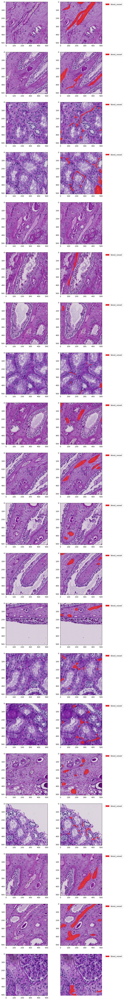

In [33]:
dataDir = Path("/kaggle/working/images")
annFile = Path(f"/kaggle/working/coco_annotations_valid_all_wsi34.json")

colors = ['Set1','Set3'] 
legend = ids_categories #{1: 'blood_vessel',2:glomerulus}

coco = COCO(annFile)
imgIds = coco.getImgIds()
imgs = coco.loadImgs(imgIds[30:50])

fig, axs = plt.subplots(len(imgs), 2, figsize=(10, 5*len(imgs)))
for img, ax_row in zip(imgs, axs):
    ax = ax_row[0]  # Access the first axis in each row
    I = io.imread(dataDir / img["file_name"])
    annIds = coco.getAnnIds(imgIds=[img["id"]])
    anns = coco.loadAnns(annIds)
    ax.imshow(I)
    ax = ax_row[1]  # Access the second axis in each row
    ax.imshow(I)
    plt.sca(ax)
    for i, ann in enumerate(anns):
        category_id = ann['category_id']
        color = colors[category_id-1]
        #-----------------------------------------
        mask = coco.annToMask(ann)
        mask = np.ma.masked_where(mask == 0, mask)
    
        ax.imshow(mask, cmap=color, alpha=0.8)
        #-----------------------------------------
        handles = []
        for category_id in legend:
            color = colors[category_id - 1]
            handles.append(mpatches.Patch(color=plt.colormaps.get_cmap(color)(0)))
        ax.legend(handles, legend.values(), bbox_to_anchor=(1.05, 1), loc='upper left')

plt.axis('off')
plt.show()

In [34]:
len(glob('/kaggle/working/images/*.tif')), len(glob('/kaggle/working/masks/*.npy'))

(1290, 1290)